In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import imageio
imageio.plugins.ffmpeg.download()
import time
from moviepy.editor import VideoFileClip
from collections import deque
import os

%matplotlib inline

In [2]:
def display(idx, inputImage, outputImage, inputText, outputText, imgName, saveFolder, save=False):
    f, (axis1, axis2) = plt.subplots(1, 2, figsize=(15,10))
    axis1.imshow(cv2.cvtColor(inputImage, cv2.COLOR_BGR2RGB))
    axis1.set_title(str(idx)+'. '+ inputText +' ('+imgName+'.jpg)', fontsize=16)
    axis2.imshow(cv2.cvtColor(outputImage, cv2.COLOR_BGR2RGB))
    axis2.set_title(str(idx)+'. '+ outputText +' ('+imgName+'_out.jpg)', fontsize=16)
    plt.show()
    if save: 
        if not os.path.exists("output_images/" + saveFolder): os.makedirs("output_images/" + saveFolder)
        plt.savefig("output_images/" + saveFolder+"/"+imgName+'_out.jpg')
    else: 
        return

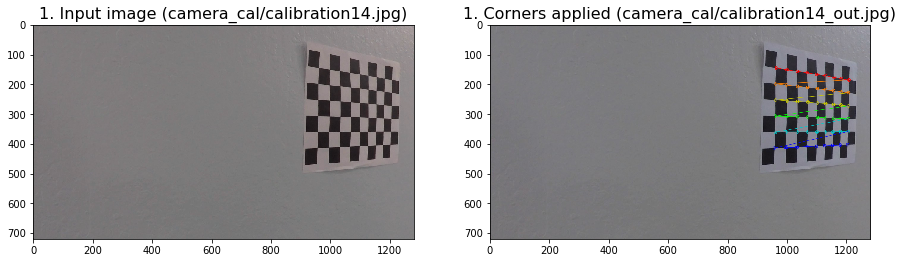

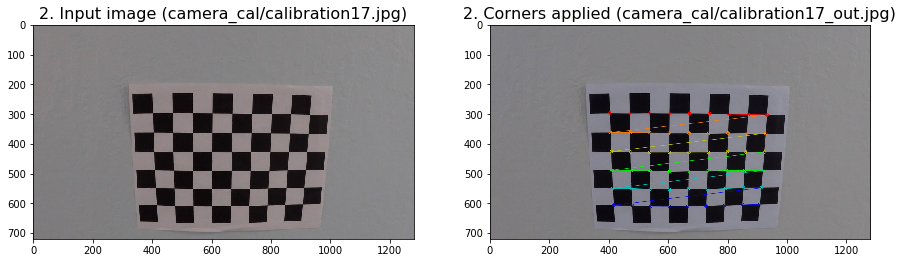

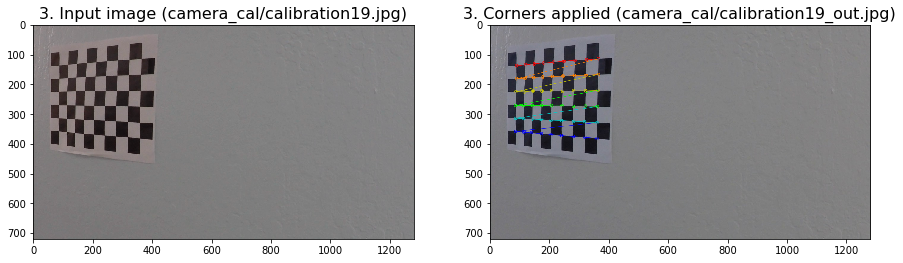

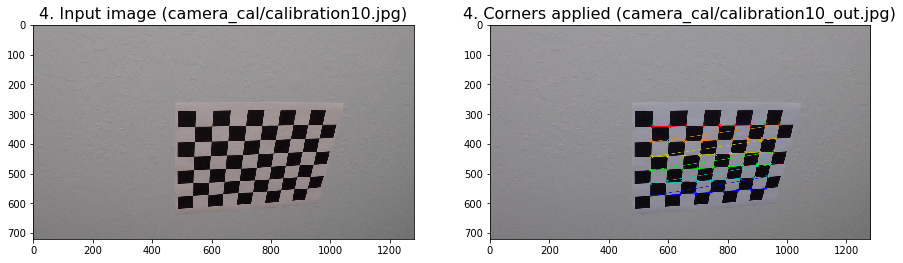

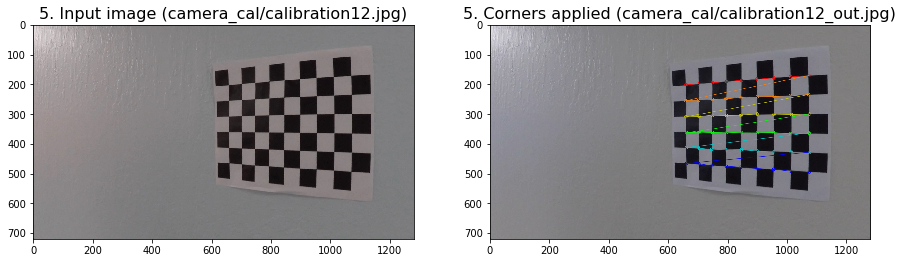

...

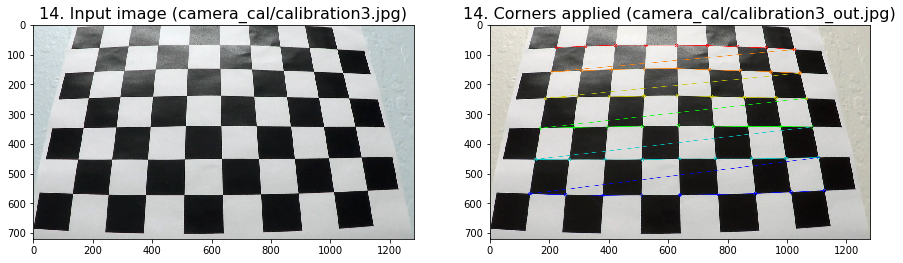

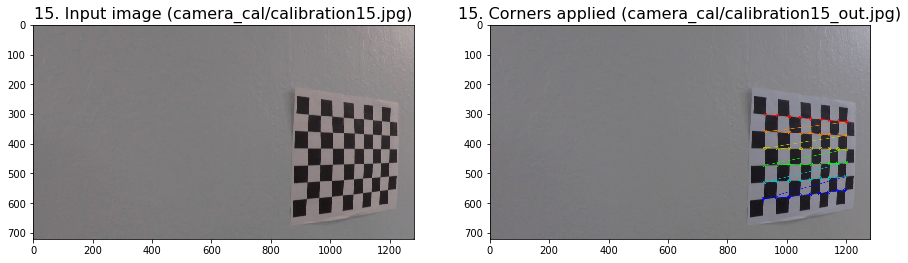

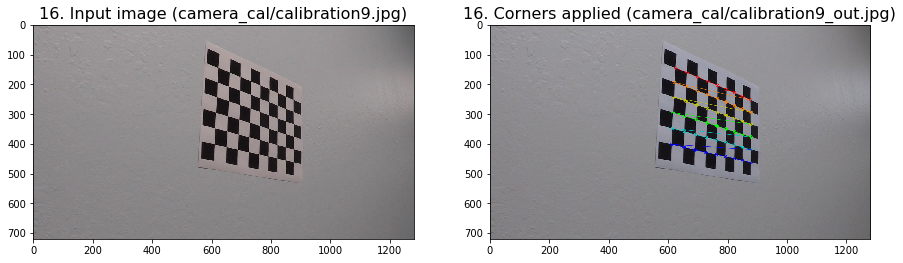

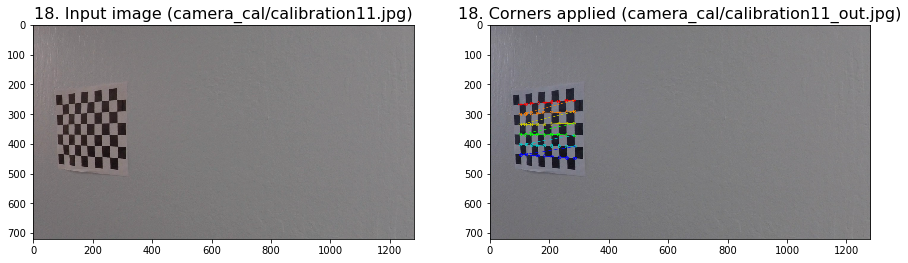

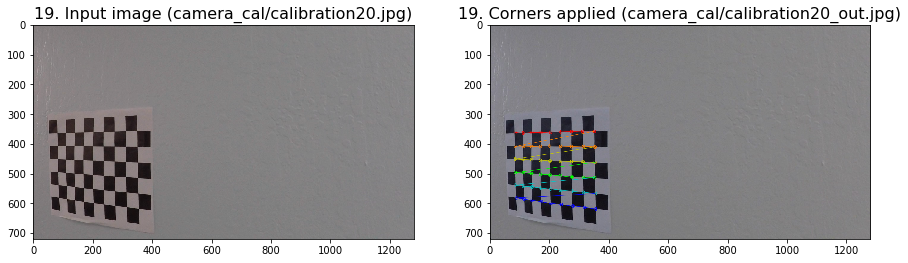

In [3]:
# Refer to here for this block: https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_calib3d/py_calibration/py_calibration.html
# prepare object points

nx = 9
ny = 6

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Create object points
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

for i, img in enumerate(glob.glob('./camera_cal/calibration*.jpg')):
    img_name = img.split('/', 1)[1].split('.', 1)[0]
    imgr = cv2.imread(img)
    gray = cv2.cvtColor(imgr,cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    # If found, add object points, img points (after refining them)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        cv2.drawChessboardCorners(imgr, (nx,ny), corners, ret)
        
        display(i, 
                inputImage=mpimg.imread(img),
                outputImage=imgr,
                inputText='Input image', 
                outputText='Corners applied', 
                imgName=img_name, 
                saveFolder='chess_distort_correction', 
                save=False)

In [4]:
def undistort(idx, img, disp=True, read=True, img_name=None):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if disp:
        display(idx         = idx, 
                inputImage  = img,
                outputImage = undist,
                inputText   = 'Original', 
                outputText  = 'Undistorted', 
                imgName     = img_name, 
                saveFolder  = 'road_undistort', 
                save        = True)
    else:
        return undist

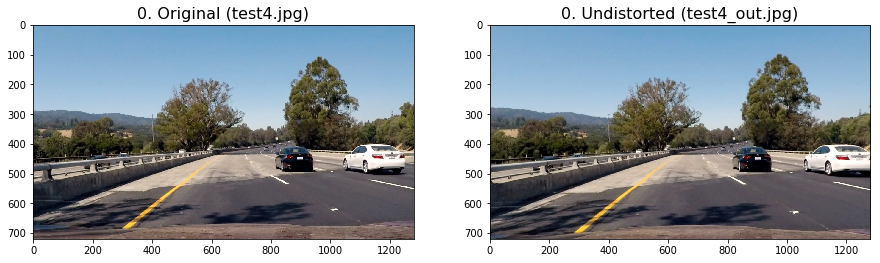

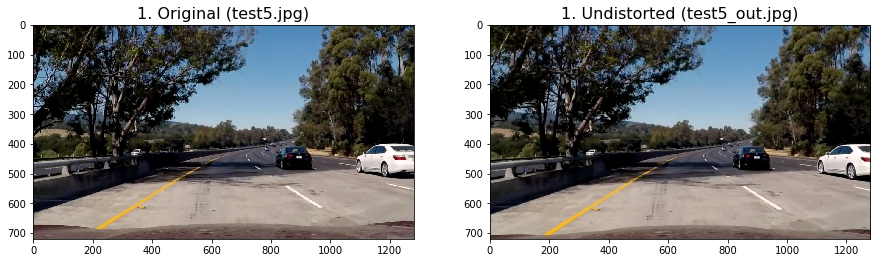

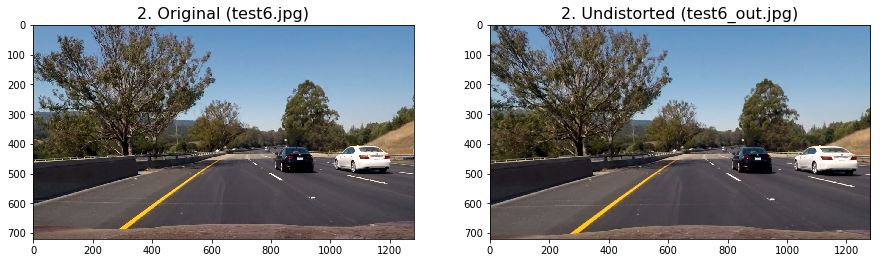

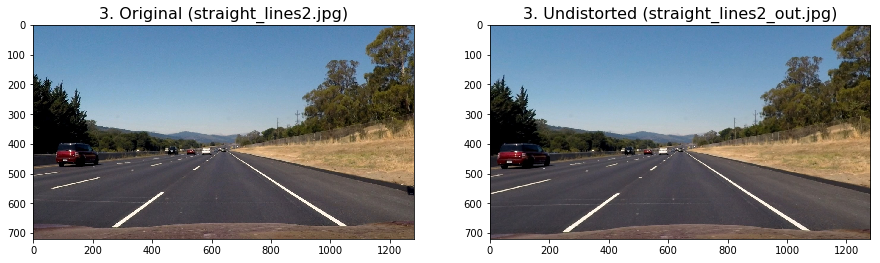

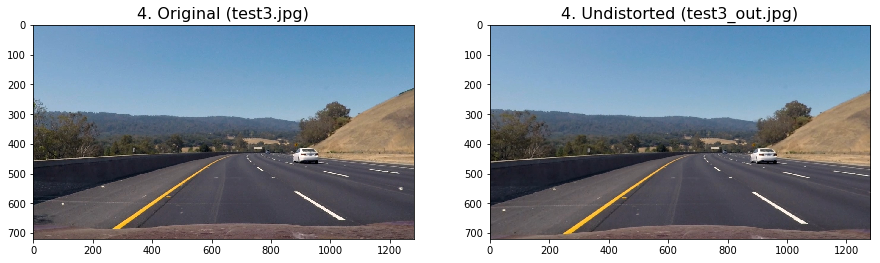

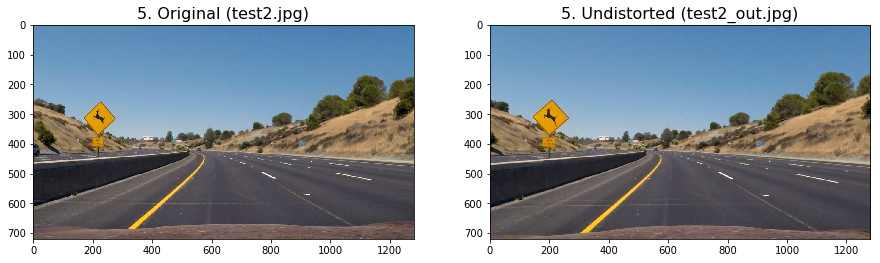

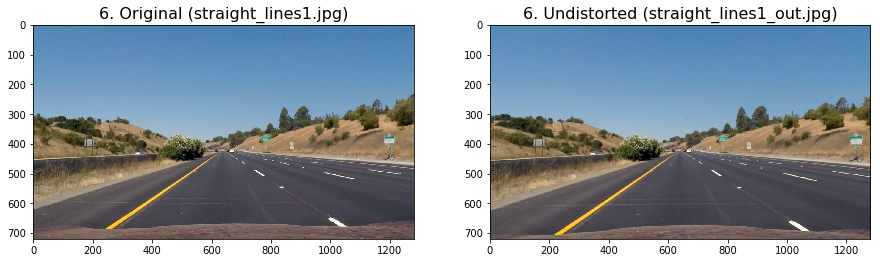

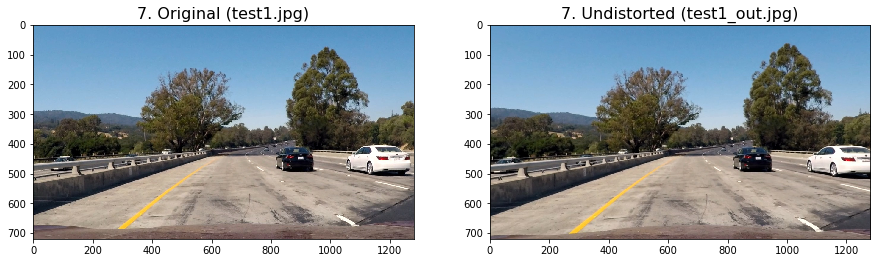

In [5]:
for i, img in zip(range(len(glob.glob('test_images/*.jpg'))), glob.glob('test_images/*.jpg')):
        undistort(i, img=cv2.imread(img), img_name=img.split('/', 1 )[1].split('.', 1 )[0])

In [6]:
# Do perspective transform
def warper(idx, img, disp=True, read=True, img_name=None):
    undist_img = undistort(idx, img, disp = False, read = False, img_name=img_name)
    
    # Points on source image
    src = np.float32([[undist_img.shape[1] * 0.40, undist_img.shape[0] * 0.67],
                      [undist_img.shape[1] * 0.61, undist_img.shape[0] * 0.67],
                      [undist_img.shape[1] * 1.00, undist_img.shape[0] * 1.00],
                      [undist_img.shape[1] * 0.04, undist_img.shape[0] * 1.00]])
    
    # Corresponding points on destination image
    dst = np.float32([[undist_img.shape[1] * 0.00, undist_img.shape[0] * 0.00],
                      [undist_img.shape[1] * 1.00, undist_img.shape[0] * 0.00],
                      [undist_img.shape[1] * 1.00, undist_img.shape[0] * 1.00],
                      [undist_img.shape[1] * 0.00, undist_img.shape[0] * 1.00]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist_img, M, (undist_img.shape[1], undist_img.shape[0]))

    if disp:
        display(idx         = idx, 
                inputImage  = undist_img,
                outputImage = warped,
                inputText   = 'Undistorted Image',
                outputText  = 'Undistorted & Warped', 
                imgName     = img_name, 
                saveFolder  = 'warper', 
                save        = True)
    else:
        return warped, M, Minv

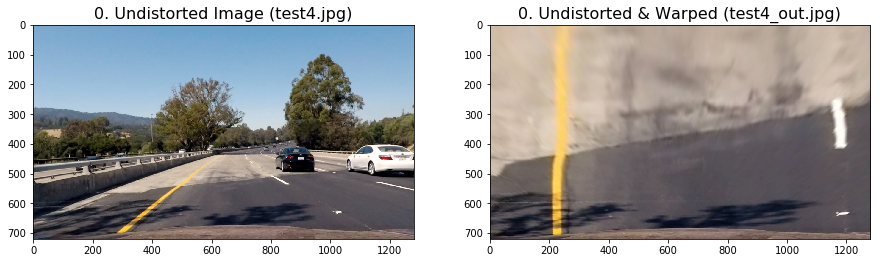

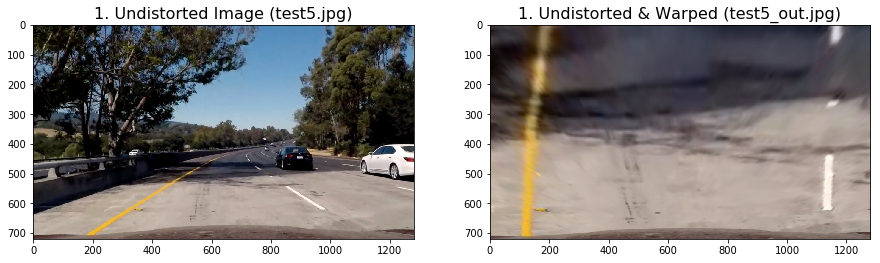

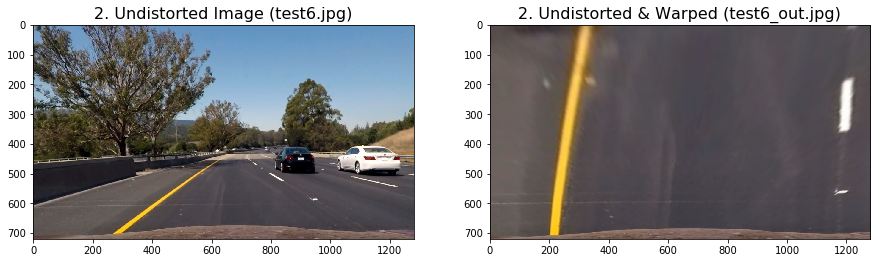

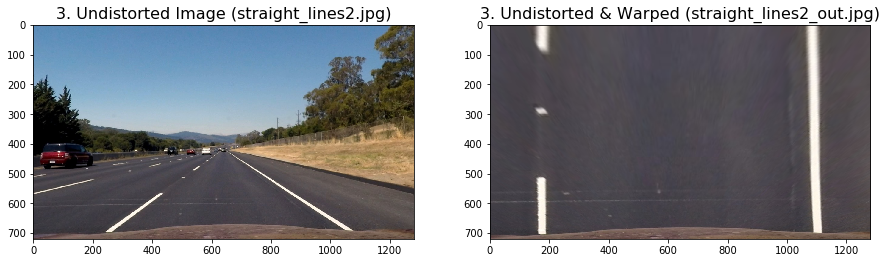

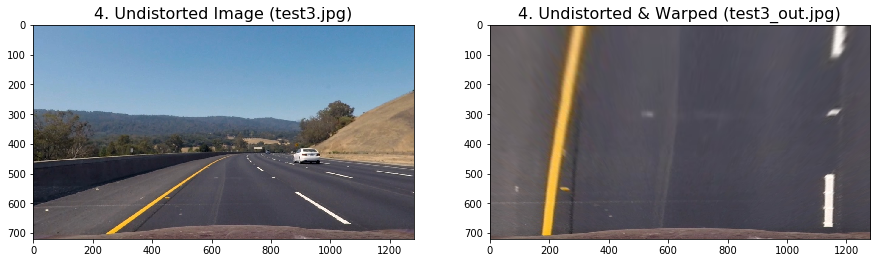

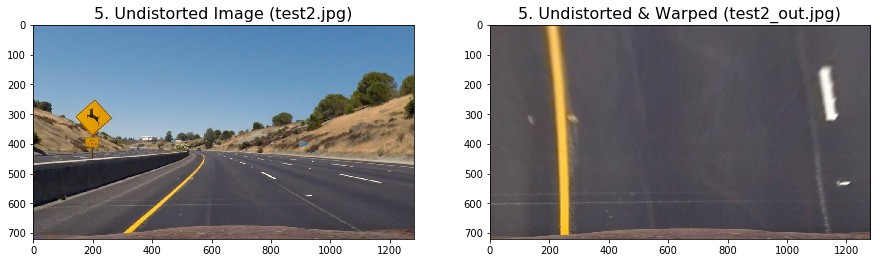

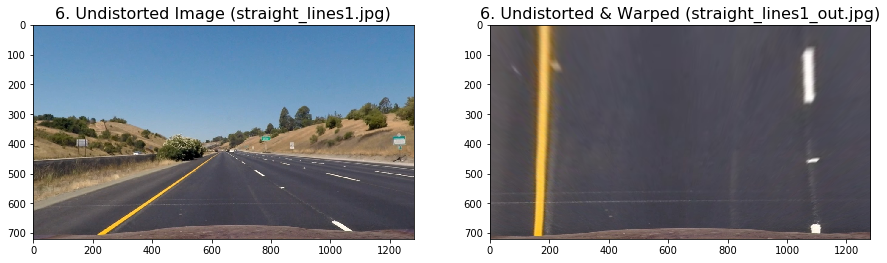

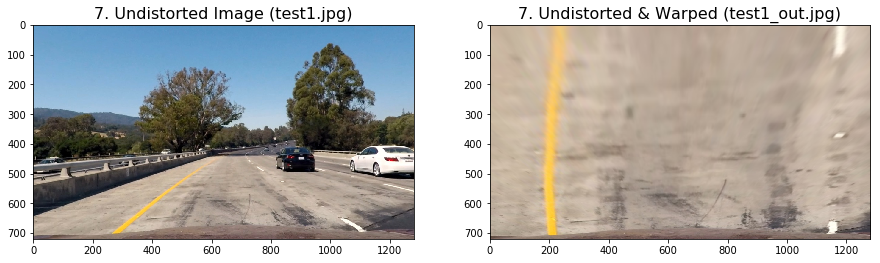

In [7]:
for i, img in zip(range(len(glob.glob('test_images/*.jpg'))), glob.glob('test_images/*.jpg')):
        warper(i, img=cv2.imread(img), img_name=img.split('/', 1 )[1].split('.', 1 )[0])

In [8]:
# Create binary thresholded images to isolate lane line pixels
def apply_binary_thresholds(idx, img, disp=True, read=True, img_name=img_name, save=False):
    img2, M, Minv = warper(idx, img, disp=False, read=False, img_name=img_name)  

    # Defining threshold of the color channels used
    
    # Get the binary image of the saturation channel of the HLS color space
    # Saturation identifies white and yellow lane lines, but handles shadows poorly.
    s_binary = np.zeros_like(cv2.cvtColor(img2, cv2.COLOR_BGR2HLS)[:,:,2])
    s_binary[(cv2.cvtColor(img2, cv2.COLOR_BGR2HLS)[:,:,2] >= 180) & 
             (cv2.cvtColor(img2, cv2.COLOR_BGR2HLS)[:,:,2] <= 255)] = 1
    
    # Get the binary image of the 'L' channel of the LUV color space
    # Identifies white lane lines well, but misses the yellow lines
    l_binary = np.zeros_like(cv2.cvtColor(img2, cv2.COLOR_BGR2LUV)[:,:,0])
    l_binary[(cv2.cvtColor(img2, cv2.COLOR_BGR2LUV)[:,:,0] >= 225) & 
             (cv2.cvtColor(img2, cv2.COLOR_BGR2LUV)[:,:,0] <= 255)] = 1

    # Get the binary image of the 'B' channel of the LAB color space
    # Identifies yellow lane lines well, but misses the white lines
    b_binary = np.zeros_like(cv2.cvtColor(img2, cv2.COLOR_BGR2Lab)[:,:,2])
    b_binary[(cv2.cvtColor(img2, cv2.COLOR_BGR2Lab)[:,:,2] >= 155) & 
             (cv2.cvtColor(img2, cv2.COLOR_BGR2Lab)[:,:,2] <= 200)] = 1
    
    # Combine the three binary channels
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if disp:
        # Plotting thresholded images
        f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(17,13))
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
        ax1.set_title('Undistorted', fontsize=16)
        ax1.imshow(cv2.cvtColor(undistort(idx, img, disp=False),cv2.COLOR_BGR2RGB))
        
        ax2.set_title('Warped', fontsize=16)
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB).astype('uint8'))
        
        ax3.set_title('S-binary', fontsize=16)
        ax3.imshow(s_binary, cmap='gray')
        
        ax4.set_title('B-binary', fontsize=16)
        ax4.imshow(b_binary, cmap='gray')
        
        ax5.set_title('L-binary', fontsize=16)
        ax5.imshow(l_binary, cmap='gray')

        ax6.set_title('Combined', fontsize=16)
        ax6.imshow(combined_binary, cmap='gray')
        
        if save: 
            if not os.path.exists('output_images/binary_thresholds'): os.makedirs('output_images/binary_thresholds')
            plt.savefig('output_images/binary_thresholds'+img_name+'_out.jpg')
    else: 
        return combined_binary, Minv

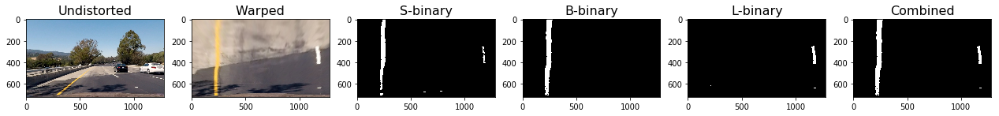

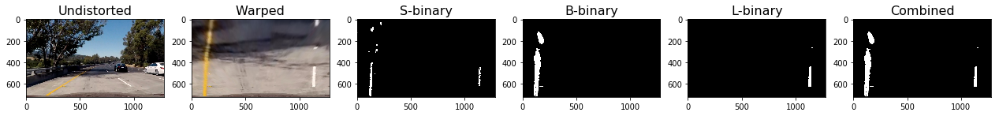

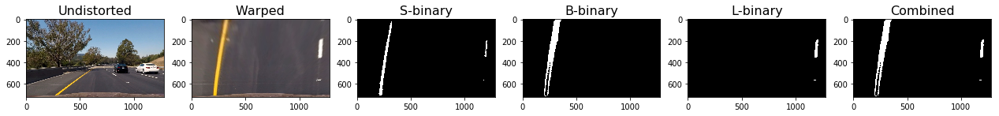

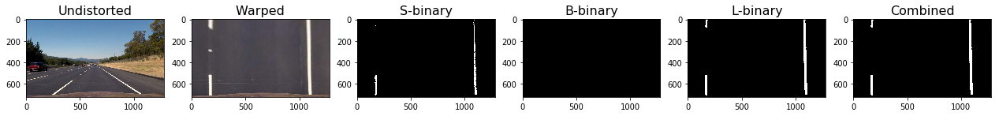

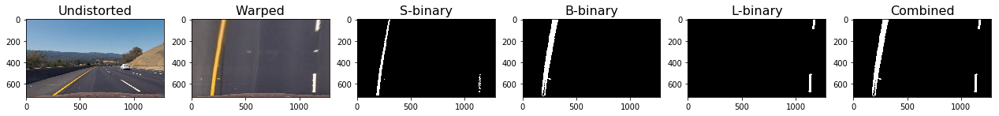

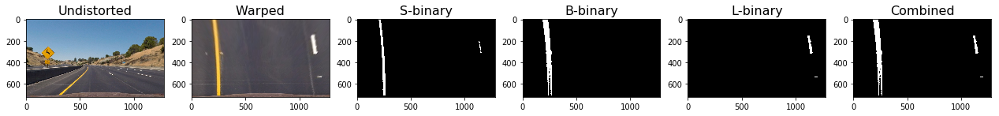

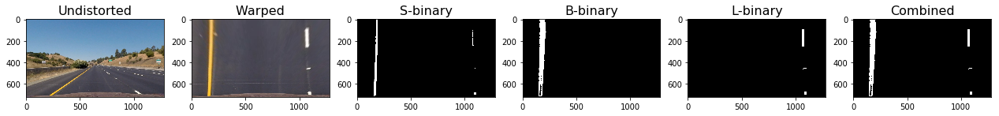

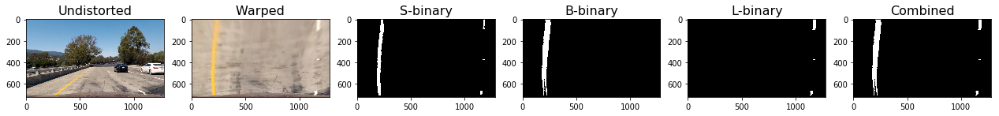

In [9]:
for i, img in zip(range(len(glob.glob('test_images/*.jpg'))), glob.glob('test_images/*.jpg')):
    apply_binary_thresholds(i, img=cv2.imread(img), img_name=img.split('/', 1 )[1].split('.', 1 )[0], save=True)    

In [10]:
def color_lane(idx, img, img_name=None):
    binImg, Minv = apply_binary_thresholds(idx, img, disp=False)
    
    right_x = []
    left_x = []
    
    left_y = []
    right_y = []
        
    x, y = np.nonzero(np.transpose(binImg))
    
    i = 720
    j = 630
    
    while j >= 0:
        histogram_bars = np.sum(binImg[j:i,:], axis=0)
        
        # Calculations for left peak
        left_peak = np.argmax(histogram_bars[:640])
        x_index = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        window_x, window_y = x[x_index], y[x_index]
        if np.sum(window_x) != 0:
            left_x.extend(window_x.tolist())
            left_y.extend(window_y.tolist())

        # Calculations for right peak    
        right_peak = np.argmax(histogram_bars[640:]) + 640
        x_index = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        window_x, window_y = x[x_index], y[x_index]
        if np.sum(window_x) != 0:
            right_x.extend(window_x.tolist())
            right_y.extend(window_y.tolist())
        i -= 90
        j -= 90

    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
    
    left_lane_fit = np.polyfit(left_y, left_x, 2)
    left_lane_fitx = left_lane_fit[0]*left_y**2 + left_lane_fit[1]*left_y + left_lane_fit[2]
    
    right_lane_fit = np.polyfit(right_y, right_x, 2)
    right_lane_fitx = right_lane_fit[0]*right_y**2 + right_lane_fit[1]*right_y + right_lane_fit[2]
    
    right_x_int = right_lane_fit[0]*720**2 + right_lane_fit[1]*720 + right_lane_fit[2]
    right_x = np.append(right_x,right_x_int)
    right_y = np.append(right_y, 720)
    
    right_x = np.append(right_x, right_lane_fit[0]*0**2 + right_lane_fit[1]*0 + right_lane_fit[2])
    right_y = np.append(right_y, 0)
    
    left_x_int = left_lane_fit[0]*720**2 + left_lane_fit[1]*720 + left_lane_fit[2]
    left_x = np.append(left_x, left_x_int)
    left_y = np.append(left_y, 720)
    
    left_x = np.append(left_x, left_lane_fit[0]*0**2 + left_lane_fit[1]*0 + left_lane_fit[2])
    left_y = np.append(left_y, 0)
    
    lsort = np.argsort(left_y)
    rsort = np.argsort(right_y)
    
    left_y = left_y[lsort]
    left_x = left_x[lsort]
    
    right_y = right_y[rsort]
    right_x = right_x[rsort]
    
    left_lane_fit = np.polyfit(left_y, left_x, 2)
    left_lane_fitx = left_lane_fit[0]*left_y**2 + left_lane_fit[1]*left_y + left_lane_fit[2]
    right_lane_fit = np.polyfit(right_y, right_x, 2)
    right_lane_fitx = right_lane_fit[0]*right_y**2 + right_lane_fit[1]*right_y + right_lane_fit[2]
    
    # Find radius of curvature for both lane line
    xm_per_pix = 3.7/700 # meteres/pixel in x dimension
    ym_per_pix = 30.0/720 # meters/pixel in y dimension
   
    left_lane_fit_curvature = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
    right_lane_fit_curvature = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
    radius_left_curve = ((1 + (2*left_lane_fit_curvature[0]*np.max(left_y) + left_lane_fit_curvature[1])**2)**1.5) \
                                 /np.absolute(2*left_lane_fit_curvature[0])
    radius_right_curve = ((1 + (2*right_lane_fit_curvature[0]*np.max(left_y) + right_lane_fit_curvature[1])**2)**1.5) \
                                    /np.absolute(2*right_lane_fit_curvature[0])
    
    # Find position of the vehicle
    vehicles_center = abs(640 - ((right_x_int+left_x_int)/2))
    
    # offset = 0 
    img_size = (binImg.shape[1], binImg.shape[0])
    
    warp_zero = np.zeros_like(binImg).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_lane_fitx, left_y])))])
    pts_right = np.array([np.transpose(np.vstack([right_lane_fitx, right_y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0, 0, 255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    new_warp = cv2.warpPerspective(color_warp, Minv, (binImg.shape[1], binImg.shape[0]))
    result = cv2.addWeighted(mpimg.imread(img_name), 1, new_warp, 0.5, 0)
    
    f, (axis1, axis2) = plt.subplots(1,2, figsize=(15, 11))
    axis1.imshow(cv2.cvtColor((warper(idx, img, disp=False)[0]), cv2.COLOR_BGR2RGB))
    axis1.set_xlim(0, 1280)
    axis1.set_ylim(0, 768)
    axis1.plot(left_lane_fitx, left_y, color='green', linewidth=3)
    axis1.plot(right_lane_fitx, right_y, color='green', linewidth=3)
    axis1.set_title('Polynomial fit to Lane Lines', fontsize=16)
    axis1.invert_yaxis() # to visualize as we do the images
    axis2.imshow(result)
    axis2.set_title('Color Lane Between Polynomials', fontsize=16)
    if vehicles_center < 640:
        axis2.text(230, 50, 'Vehicle is left of center by : {:.2f}m'.format(vehicles_center*3.7/700),
                 style='italic', color='white', fontsize=14)
    else:
        axis2.text(230, 50, 'Vehicle is right of center by : {:.2f}m'.format(vehicles_center*3.7/700),
                 style='normal', color='white', fontsize=14)
    axis2.text(230, 125, 'Lane curvature radius is : {}m'.format(int((radius_left_curve + radius_right_curve)/2)),
             style='normal', color='white', fontsize=14)
    #plt.savefig(color_lanes_imgs_folder+"/"+image_name+'_out.jpg')

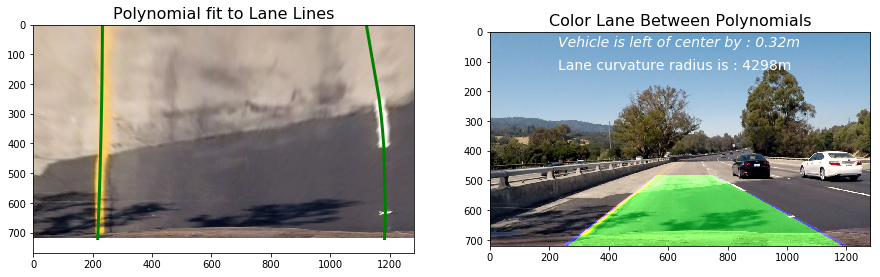

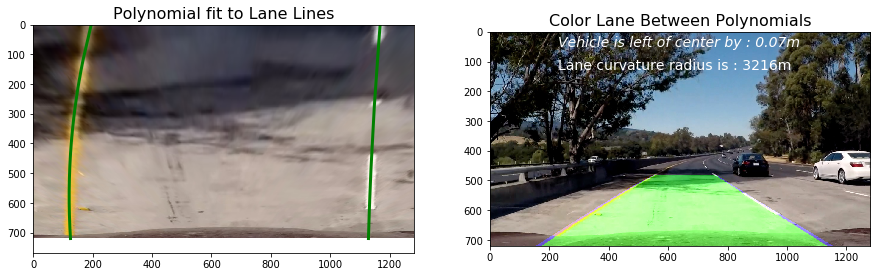

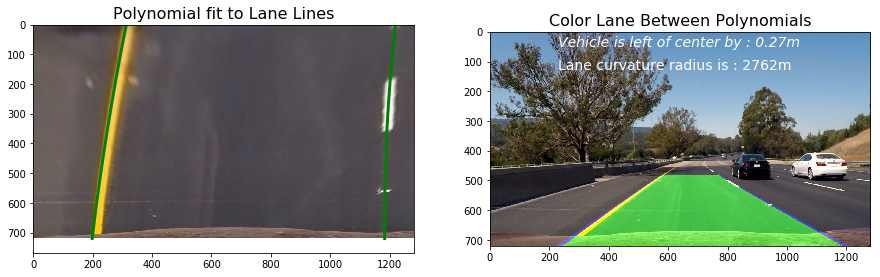

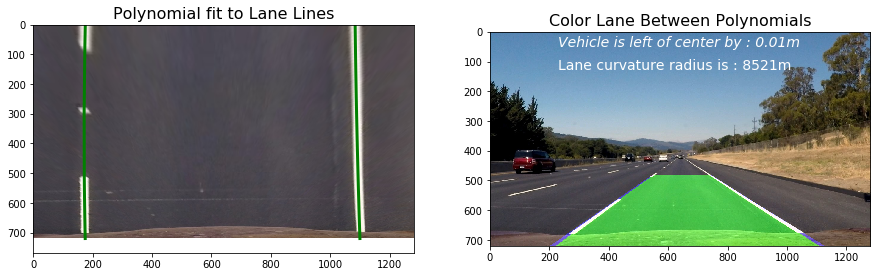

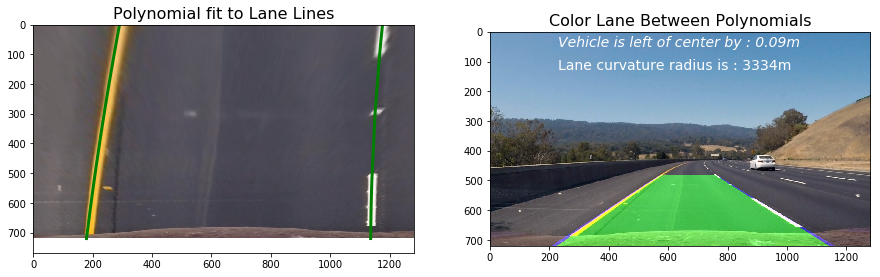

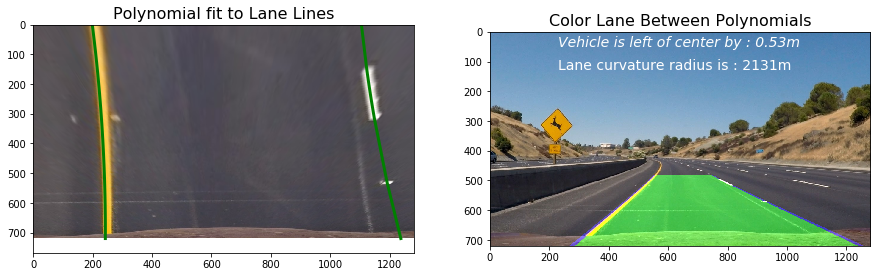

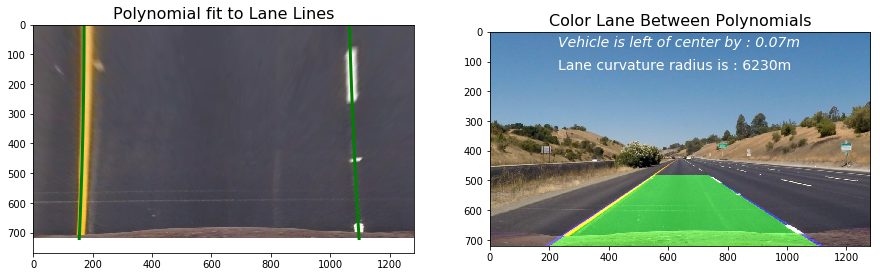

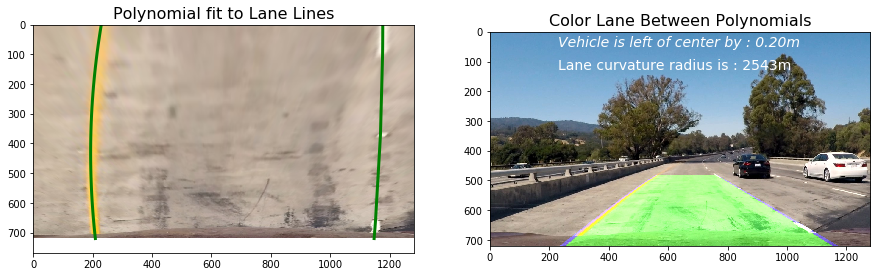

In [11]:
for i, img in zip(range(len(glob.glob('test_images/*.jpg'))), glob.glob('test_images/*.jpg')):
    color_lane(i, img=cv2.imread(img), img_name=img)

In [12]:
"""
Class to store Lane Line attributes from one frame to the next, and helper fns. 
"""
class Line:
    def __init__(self):
        MAX_LEN = 10
        # Is the line found in the previous frame
        self.found = False
        
        # Memorize last x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Memorize radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=MAX_LEN)
        self.fit1 = deque(maxlen=MAX_LEN)
        self.fit2 = deque(maxlen=MAX_LEN)
        
        self.fitx = None
        self.pts = []
        
        # Memorize x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Keep recent 'x' intercepts avg. across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
           
        # Count of number of frames
        self.count = 0
        
    """
    Applied when we have detected lane lines in the previous frame. Uses a sliding window to search 
    for lane pixels in close proximity (+/- 25 pixels in the x direction) around the previous 
    detected polynomial. 
    """
    def targeted_search(self, x, y):
        x_vals = []
        y_vals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                y_val = np.mean([i,j])
                x_val = (np.mean(self.fit0))*y_val**2 + (np.mean(self.fit1))*y_val + (np.mean(self.fit2))
                x_idx = np.where((((x_val - 25) < x)&(x < (x_val + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(x_vals, x_window)
                    np.append(y_vals, y_window)
                i -= 90
                j -= 90
        if np.sum(x_vals) == 0: 
            self.found = False
        return x_vals, y_vals, self.found
    
    """
    (1). Applied in the first few frames and/or 
    (2). If the lane was not successfully detected in the previous frame. 
    
    Uses a slinding window approach to detect peaks in a histogram of the binary thresholded image. 
    Pixels in close proimity to the detected peaks are considered belonging to the lane lines.
    """
    def random_search(self, x, y, img):
        x_vals = []
        y_vals = []
        if self.found == False: 
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(img[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    x_vals.extend(x_window)
                    y_vals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(x_vals) > 0:
            self.found = True
        else:
            y_vals = self.Y
            x_vals = self.X
        return x_vals, y_vals, self.found
    
    def find_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top
    
    def calculate_radius_of_curvature(self, x_vals, y_vals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(y_vals*ym_per_pix, x_vals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(y_vals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    
    def sort_values(self, x_vals, y_vals):
        sorted_index = np.argsort(y_vals)
        sorted_y_vals = y_vals[sorted_index]
        sorted_x_vals = x_vals[sorted_index]
        return sorted_x_vals, sorted_y_vals

In [13]:
# Pipeline for Video Processing
def process_video(img):
    img_size = (img.shape[1], img.shape[0])
 
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist_img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Perspective transform
    # Points on source image
    src = np.float32([[undist_img.shape[1] * 0.40, undist_img.shape[0] * 0.67],
                      [undist_img.shape[1] * 0.61, undist_img.shape[0] * 0.67],
                      [undist_img.shape[1] * 1.00, undist_img.shape[0] * 1.00],
                      [undist_img.shape[1] * 0.04, undist_img.shape[0] * 1.00]])
    
    # Corresponding points on destination image
    dst = np.float32([[undist_img.shape[1] * 0.00, undist_img.shape[0] * 0.00],
                      [undist_img.shape[1] * 1.00, undist_img.shape[0] * 0.00],
                      [undist_img.shape[1] * 1.00, undist_img.shape[0] * 1.00],
                      [undist_img.shape[1] * 0.00, undist_img.shape[0] * 1.00]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped_img = cv2.warpPerspective(undist_img, M, img_size)
    
    # Get binary thresholded images
    b_channel_of_lab = cv2.cvtColor(warped_img, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel_of_luv = cv2.cvtColor(warped_img, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # Fix the upper & lower thresholds for the b-channel
    b_threshold_min = 145
    b_threshold_max = 200
    b_binary_img = np.zeros_like(b_channel_of_lab)
    b_binary_img[(b_channel_of_lab >= b_threshold_min) & (b_channel_of_lab <= b_threshold_max)] = 1
    
    # Fix the upper & lower thresholds for the l-channel
    l_threshold_min = 215
    l_threshold_max = 255
    l_binary_img = np.zeros_like(l_channel_of_luv)
    l_binary_img[(l_channel_of_luv >= l_threshold_min) & (l_channel_of_luv <= l_threshold_max)] = 1

    combined_binary_img = np.zeros_like(b_binary_img)
    combined_binary_img[(l_binary_img == 1) | (b_binary_img == 1)] = 1
    
    # Detect the non-zero pixels in the img
    x, y = np.nonzero(np.transpose(combined_binary_img)) 

    if Left.found == True: # Find the left lane pixels around previous polynomial
        left_x, left_y, Left.found = Left.targeted_search(x, y)
        
    if Right.found == True: # S Find the right lane pixels around previous polynomial
        right_x, right_y, Right.found = Right.targeted_search(x, y)

    if Right.found == False: # Perform blind search for right lane lines
        right_x, right_y, Right.found = Right.random_search(x, y, combined_binary_img)
            
    if Left.found == False:# Perform blind search for left lane lines
        left_x, left_y, Left.found = Left.random_search(x, y, combined_binary_img)

    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
  
    # Find left polynomial fit based on detected pixels
    left_fit = np.polyfit(left_y, left_x, 2)
    
    # Find intercepts to extend the polynomial to the top and bottom of warped image
    left_x_int, left_top = Left.find_intercepts(left_fit)
    
    # Average intercepts across 'n' frames
    Left.x_int.append(left_x_int)
    Left.top.append(left_top)
    left_x_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = left_x_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    left_x = np.append(left_x, left_x_int)
    left_y = np.append(left_y, 720)
    left_x = np.append(left_x, left_top)
    left_y = np.append(left_y, 0)
    
    # Sort the detected pixels based on the y-vals
    left_x, left_y = Left.sort_values(left_x, left_y)
    
    Left.X = left_x
    Left.Y = left_y
    
    # Re-calculate polynomial with intercepts and average across 'n' frames
    left_fit = np.polyfit(left_y, left_x, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), np.mean(Left.fit1), np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fit_x = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    Left.fitx = left_fit_x
    
    # Find right polynomial fit based on detected pixels
    right_fit = np.polyfit(right_y, right_x, 2)

    # Find intercepts to extend the polynomial to the top and bottom of warped image
    right_x_int, right_top = Right.find_intercepts(right_fit)
    
    # Avg. the intercepts across 5 frames
    Right.x_int.append(right_x_int)
    right_x_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = right_x_int
    Right.last_top = right_top
    right_x = np.append(right_x, right_x_int)
    right_y = np.append(right_y, 720)
    right_x = np.append(right_x, right_top)
    right_y = np.append(right_y, 0)
    
    # Sort right lane pixels
    right_x, right_y = Right.sort_values(right_x, right_y)
    Right.X = right_x
    Right.Y = right_y
    
    # Re-calculate polynomial with intercepts and average across 'n' frames
    right_fit = np.polyfit(right_y, right_x, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]
    Right.fitx = right_fitx
        
    # Calculate radius of curvature for each lane (in meters)
    radius_left_curve = Left.calculate_radius_of_curvature(left_x, left_y)
    radius_right_curve = Right.calculate_radius_of_curvature(right_x, right_y)
        
    # Print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = radius_left_curve
        Right.radius = radius_right_curve
        
    # Calculate the vehicle position relative to the center of the lane
    position = (right_x_int + left_x_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
                
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped_zero = np.zeros_like(combined_binary_img).astype(np.uint8)
    color_warped = np.dstack((warped_zero, warped_zero, warped_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warped, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warped, np.int_(pts), (34,255,34))
    new_warped = cv2.warpPerspective(color_warped, Minv, (img.shape[1], img.shape[0]))
    result = cv2.addWeighted(undist_img, 1, new_warped, 0.5, 0)
        
    # Display distance from center on the created video
    if position > 640:
        cv2.putText(result, 'Vehicle is left of center by : {:.2f}m'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is right of center by : {:.2f}m'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    # Print radius of curvature on video
    cv2.putText(result, 'Lane curvature radius is : {}m'.format(int((Left.radius+Right.radius)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    Left.count += 1
    return result

In [14]:
Left = Line()
Right = Line()

VideoFileClip("project_video.mp4").fl_image(process_video).write_videofile('output_videos/project_video_ouput.mp4', audio=False)

[MoviePy] >>>> Building video output_videos/project_video_ouput.mp4
[MoviePy] Writing video output_videos/project_video_ouput.mp4


100%|█████████▉| 1260/1261 [16:11<00:00,  1.29it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_ouput.mp4 



In [15]:
Left = Line()
Right = Line()

VideoFileClip("challenge_video.mp4").fl_image(process_video).write_videofile('output_videos/challenge_video_ouput.mp4', audio=False)

[MoviePy] >>>> Building video output_videos/challenge_video_ouput.mp4
[MoviePy] Writing video output_videos/challenge_video_ouput.mp4


100%|██████████| 485/485 [06:08<00:00,  1.28it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_video_ouput.mp4 



In [16]:
Left = Line()
Right = Line()

VideoFileClip("harder_challenge_video.mp4").fl_image(process_video).write_videofile('output_videos/harder_challenge_video_ouput.mp4', audio=False)

[MoviePy] >>>> Building video output_videos/harder_challenge_video_ouput.mp4
[MoviePy] Writing video output_videos/harder_challenge_video_ouput.mp4


100%|█████████▉| 1199/1200 [16:44<00:00,  1.19it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_video_ouput.mp4 

